# FiftyOne による物体検出の評価
<!-- #  Evaluating Object Detections with FiftyOne -->

このウォークスルーでは、FiftyOne を使用して検出モデルのハンズオン評価を行う方法を示します。
<!-- This walkthrough demonstrates how to use FiftyOne to perform hands-on evaluation of your detection model. -->

以下のコンセプトをカバーしています。
<!-- It covers the following concepts: -->

- グランド・トゥルース・ラベル付きのデータセットを[FiftyOneに読み込む](https://voxel51.com/docs/fiftyone/user_guide/dataset_creation/index.html)
- データセットに [モデル予測値を追加](https://voxel51.com/docs/fiftyone/recipes/adding_detections.html)
- FiftyOne の評価 API を使ってモデルを評価する](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#detections)
- データセット内の最もパフォーマンスの高いサンプルと低いサンプルの表示

<!-- - Loading a dataset with ground truth labels [into FiftyOne](https://voxel51.com/docs/fiftyone/user_guide/dataset_creation/index.html)
- [Adding model predictions](https://voxel51.com/docs/fiftyone/recipes/adding_detections.html) to your dataset
- [Evaluating your model](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#detections) using FiftyOne's evaluation API
- Viewing the best and worst performing samples in your dataset -->

**では、何が重要なのでしょうか？** 
<!-- **So, what's the takeaway?**-->

mAP のような総合的な性能評価では、検出モデルの全体像を把握することはできません。
実際には，モデルの成績を制限する要因はデータ品質の問題であることが多く，それに対処するためには **見る** ことが必要です。
FiftyOne は，それを簡単に実現できるように設計されています。
<!-- Aggregate measures of performance like mAP don't give you the full picture of your detection model. 
In practice, the limiting factor on your model's performance is often data quality issues that you need to **see** to address. FiftyOne is designed to make it easy to do just that. -->

ここで紹介するワークフローをあなたの ML プロジェクトで実行すれば，以下のように，あなたのモデルの現在の故障モード  (エッジケース) を理解し，それを修正する方法を知ることができます。
<!-- Running the workflow presented here on your ML projects will help you to understand the current failure modes (edge cases) of your model and how to fix them, including: -->

- モデルの成績を向上させるために，追加の訓練事例が必要なシナリオを特定する。
- グランドトゥルースアノテーションにエラーや弱点があるかどうかを判断し，それを修正してからでないと，その後のモデルの訓練は利益を得られない。

<!-- - Identifying scenarios that require additional training samples in order to boost your model's performance
- Deciding whether your ground truth annotations have errors/weaknesses that need to be corrected before any subsequent model training will be profitable -->

# 1. セットアップ
<!-- ## Setup -->

まだインストールしていない場合は、FiftyOneをインストールしてください。
<!-- If you haven't already, install FiftyOne: -->

In [1]:
!pip install fiftyone > /dev/null 2>&1 

このチュートリアルでは PyTorch で提供されている既製の [Faster R-CNN detection model](https://pytorch.org/docs/stable/torchvision/models.html#faster-r-cnn)を使用します。
これを使うには，必要に応じて `torch` と `torchvision` をインストールする必要があります。
<!-- In this tutorial, we'll use an off-the-shelf [Faster R-CNN detection model](https://pytorch.org/docs/stable/torchvision/models.html#faster-r-cnn) provided by PyTorch. To use it, you'll need to install `torch` and `torchvision`, if necessary. -->

In [ ]:
#!pip install torch torchvision

次のスニペットは Web から 事前訓練されたモデルをダウンロードしてロードします。
<!-- The following snippet will download the pretrained model from the web and load it: -->

In [ ]:
import torch
import torchvision

# Run the model on GPU if it is available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load a pre-trained Faster R-CNN model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.to(device)
model.eval()

#print("Model ready")

ここでは [FiftyOne Dataset Zoo](https://voxel51.com/docs/fiftyone/user_guide/dataset_zoo/datasets.html#coco-2017) からダウンロード可能な [COCO dataset](https://cocodataset.org/#home) の検証用スプリットを使って分析を行います。

以下のスニペットは、検証スプリットをダウンロードして FiftyOne にロードします。
<!-- We'll perform our analysis on the validation split of the [COCO dataset](https://cocodataset.org/#home), which is conveniently available for download via the [FiftyOne Dataset Zoo](https://voxel51.com/docs/fiftyone/user_guide/dataset_zoo/datasets.html#coco-2017).

The snippet below will download the validation split and load it into FiftyOne. -->

In [ ]:
import fiftyone as fo
import fiftyone.zoo as foz

dataset = foz.load_zoo_dataset(
    "coco-2017",
    split="validation",
    dataset_name="evaluate-detections-tutorial",
)
dataset.persistent = True

Let's inspect the dataset to see what we downloaded:

In [ ]:
# Print some information about the dataset
print(dataset)

In [ ]:
# Print a ground truth detection
sample = dataset.first()
print(sample.ground_truth.detections[0])

なお， グランドトゥルースの検出値は，サンプルの `ground_truth` フィールドに格納されています。

先に進む前に [FiftyOne App](https://voxel51.com/docs/fiftyone/user_guide/app.html) を起動して GUI を使ってデータセットを視覚的に探索してみましょう。
<!-- Note that the ground truth detections are stored in the `ground_truth` field of the samples.

Before we go further, let's launch the [FiftyOne App](https://voxel51.com/docs/fiftyone/user_guide/app.html) and use the GUI to explore the dataset visually: -->

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


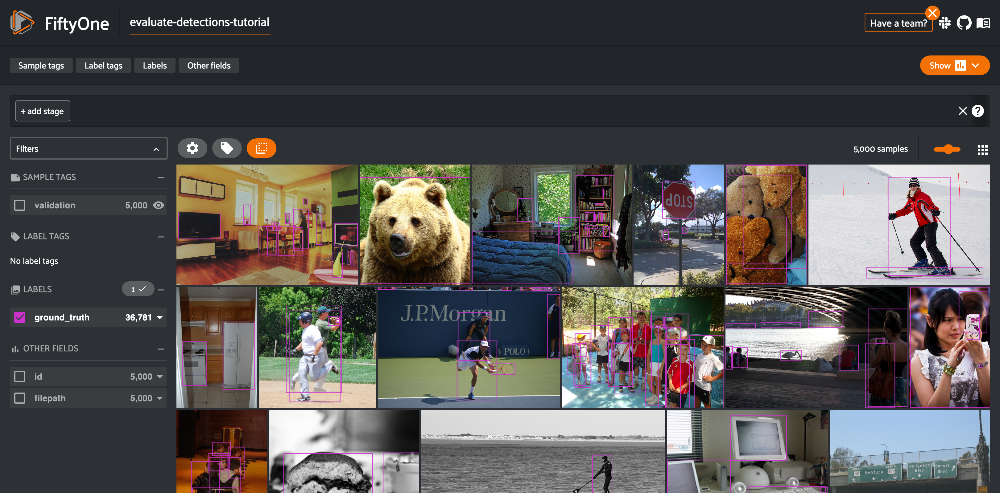

<IPython.core.display.Javascript object>

In [7]:
session = fo.launch_app(dataset)

# 2. 予測値をデータセットに追加する
<!-- ## Add predictions to dataset -->

それでは，分析するための予測値を生成してみましょう。
<!-- Now let's generate some predictions to analyze. -->

以下のコードは，データセットからランダムに選ばれた 100 個のサンプルのサブセットに対して Faster R-CNN モデルによる推論を行い，その結果得られた予測値をサンプルの `faster_rcnn` フィールドに格納します。
<!-- The code below performs inference with the Faster R-CNN model on a randomly chosen subset of 100 samples from the dataset and stores the resulting predictions in a `faster_rcnn` field of the samples.  -->

In [19]:
# 100 個のサンプルからランダムなサブセットを選び，予測値を加える
predictions_view = dataset.take(100, seed=51)

In [ ]:
from PIL import Image
from torchvision.transforms import functional as func

import fiftyone as fo

# Get class list
classes = dataset.default_classes

# Add predictions to samples
with fo.ProgressBar() as pb:
    for sample in pb(predictions_view):
        # Load image
        image = Image.open(sample.filepath)
        image = func.to_tensor(image).to(device)
        c, h, w = image.shape
        
        # Perform inference
        preds = model([image])[0]
        labels = preds["labels"].cpu().detach().numpy()
        scores = preds["scores"].cpu().detach().numpy()
        boxes = preds["boxes"].cpu().detach().numpy()
        
        # Convert detections to FiftyOne format
        detections = []
        for label, score, box in zip(labels, scores, boxes):
            # Convert to [top-left-x, top-left-y, width, height]
            # in relative coordinates in [0, 1] x [0, 1]
            x1, y1, x2, y2 = box
            rel_box = [x1 / w, y1 / h, (x2 - x1) / w, (y2 - y1) / h]

            detections.append(
                fo.Detection(
                    label=classes[label],
                    bounding_box=rel_box,
                    confidence=score
                )
            )
        
        # Save predictions to dataset
        sample["faster_rcnn"] = fo.Detections(detections=detections)
        sample.save()

print("Finished adding predictions")

アプリで `predictions_view` をロードして，追加した予測値を視覚化してみましょう。
<!-- Let's load `predictions_view` in the App to visualize the predictions that we added: -->

In [ ]:
session.view = predictions_view

# 3. 検出結果の分析
<!-- ## Analyzing detections -->

データセットに追加した生の予測値を、さらに詳しく分析してみましょう。
<!-- Let's analyze the raw predictions we've added to our dataset in more detail. -->

## 3.1 バウンディングボックスの可視化
<!-- ### Visualizing bounding boxes -->

まずは データセット一式を App に読み込んでみましょう: 
<!-- Let's start by loading the full dataset in the App: -->

```
# This is formatted as code
```






In [ ]:
# セッションをリセットする。データセット全体が表示されるようになる
session.view = None

`predictions_view` にある 100 個のサンプルだけが `faster_rcnn` フィールドに予測値を持っているので，上で見たサンプルの中には，予測されたボックスを持っていないものもあります。
<!-- Only the 100 samples in `predictions_view` have predictions in their `faster_rcnn` field, so some of the samples we see above do not have predicted boxes. -->

予測ビューを復元するには，プログラムで `session.view = predictions_view` とするか [アプリ内のビューバー](https://voxel51.com/docs/fiftyone/user_guide/app.html#using-the-view-bar) を使って同じことを行うことができます。
<!-- If we want to recover our predictions view, we can do this programmatically via `session.view = predictions_view`, or we can use the [view bar in the App](https://voxel51.com/docs/fiftyone/user_guide/app.html#using-the-view-bar) to accomplish the same thing: -->

In [ ]:
# ビューバーを使って、`Exists(faster_rcnn, True)` のステージを作成します。
# これで、ビューには、`faster_rcnn` フィールドの予測値を持つ 100 個のサンプルだけが含まれるようになります。
session.show()

サンプルの各フィールドは、左側のサイドバーに切り替え可能なチェックボックスで表示され、グラウンドトゥルースの検出値や予測値を画像上に表示するかどうかをコントロールすることができます。
<!-- Each field of the samples are shown as togglable checkboxes on the left sidebar which can be used to control whether ground truth detections or predictions are rendered on the images.-->

また、画像をクリックすると、そのサンプルの詳細を見ることができます。
<!--
You can also click on an image to view the sample in more detail: -->

In [ ]:
session.show()

## 3.2 興味のあるサンプルを選択する
<!-- ### Selecting samples of interest -->

本アプリでは、画像にカーソルを合わせてチェックボックスをクリックすることで、画像を選択することができます。その後、サンプルグリッドの左上にある選択されたサンプル数のオレンジ色のチェックマークをクリックし、「Only show selected samples」をクリックすると、そのサンプルだけを集めたビューを作成することができます。
<!--
You can select images in the App by clicking on the checkbox when hovering over an image. Then, you can create a view that contains only those samples by clicking the orange checkmark with the number of selected samples in the top left corner of the sample grid and clicking `Only show selected samples`. -->

In [ ]:
session.show()

セッションをリセットして `predictions_view` を表示してみましょう。
<!-- Let's reset our session to show our `predictions_view`: -->

In [ ]:
session.view = predictions_view

### アプリでの信頼性のしきい値設定
<!-- ### Confidence thresholding in the App -->

上のアプリのインスタンスから，検出器が低品質の検出をいくつかスプリアスに生成しているように見えます。
このアプリを使って， 予測値を「信頼度」でインタラクティブにフィルタリングし，モデルに適した信頼度の閾値を特定してみましょう。
<!--
From the App instance above, it looks like our detector is generating some spurious low-quality detections. Let's use the App to interactively filter the predictions by `confidence` to identify a reasonable confidence threshold for our model: -->

In [ ]:
# Fields Sidebar の`faster_rcnn` フィールド上で下向きのキャレットをクリックし，信頼性閾値を適用する
session.show()

今回のモデルでは，信頼性の閾値を 0.75 とするのが良いようですが,
後で定量的に確認してみましょう。
<!-- It looks like a confidence threshold of 0.75 is a good choice for our model, but we'll confirm that quantitatively later. -->

## 3.2 Python での信頼性の閾値設定
<!-- ### Confidence thresholding in Python -->

また FiftyOne には，検出物の属性に基づいてマッチング，フィルタリング，ソートを行う [式を書く](https://voxel51.com/docs/fiftyone/user_guide/using_views.html#filtering) 機能があります。
詳細は [Using DatasetViews](https://voxel51.com/docs/fiftyone/user_guide/using_views.html) を参照してください。
<!-- FiftyOne also provides the ability to [write expressions](https://voxel51.com/docs/fiftyone/user_guide/using_views.html#filtering) that match, filter, and sort detections based on their attributes. See [using DatasetViews](https://voxel51.com/docs/fiftyone/user_guide/using_views.html) for full details. -->

例えば，次のように `confidence` が少なくとも `0.75` である検出物のみを含むビューをプログラムで生成することができます。
<!--
For example, we can programmatically generate a view that contains only detections whose `confidence` is at least `0.75` as follows: -->

In [22]:
from fiftyone import ViewField as F

# 信頼度が >= 0.75 の検出物のみを対象とする
high_conf_view = predictions_view.filter_labels("faster_rcnn", F("confidence") > 0.75)

In [21]:
# Print some information about the view
print(high_conf_view)

Dataset:     evaluate-detections-tutorial
Media type:  image
Num samples: 98
Tags:        ['validation']
Sample fields:
    id:           fiftyone.core.fields.ObjectIdField
    filepath:     fiftyone.core.fields.StringField
    tags:         fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.Metadata)
    ground_truth: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    faster_rcnn:  fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
View stages:
    1. Take(size=100, seed=51)
    2. FilterLabels(field='faster_rcnn', filter={'$gt': ['$$this.confidence', 0.75]}, only_matches=True, trajectories=False)


In [24]:
# ビューの予測値を印刷して、その信頼度が0.75以上であることを確認する
sample = high_conf_view.first()
print(sample.faster_rcnn.detections[0])

<Detection: {
    'id': '61a167fa4d6c2a478c8747db',
    'attributes': BaseDict({}),
    'tags': BaseList([]),
    'label': 'person',
    'bounding_box': BaseList([
        0.2085207223892212,
        0.4248880043189396,
        0.20568811893463135,
        0.2677845974846365,
    ]),
    'mask': None,
    'confidence': 0.9985471367835999,
    'index': None,
}>


それでは，プログラムで選択した予測結果を表示するために App でビューをロードしてみましょう。
<!-- Now let's load our view in the App to view the predictions that we programmatically selected: -->

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


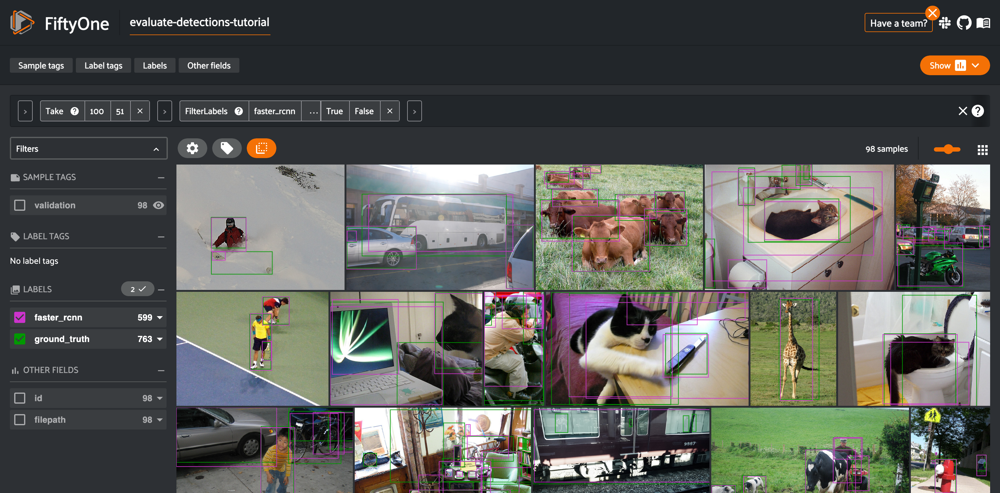

<IPython.core.display.Javascript object>

In [25]:
# 信頼性の高いビューをアプリに読み込む
session.view = high_conf_view

## 3.2 オブジェクトのパッチの表示
<!-- ### Viewing object patches -->

オブジェクトを個別に表示した方が便利な場面はいくつかあります。例えば、サンプルの中に何十個ものオブジェクトが重なっている場合や、あるクラスのオブジェクトのインスタンスを特別に探したい場合などです。
<!-- There are multiple situations where it can be useful to visualize each object separately. For example, if a sample contains dozens of objects overlapping one another or if you want to look specifically for instances of a class of objects. -->

いずれにしても、フィフティワン・アプリには [パッチ表示ボタン](https://voxel51.com/docs/fiftyone/user_guide/app.html#viewing-object-patches) が用意されており，データセット内の任意の `Detections` フィールドを取り込んで，各オブジェクトを画像グリッド内の個々のパッチとして視覚化することができます。
<!--In any case, the FiftyOne App provides a [patches view button](https://voxel51.com/docs/fiftyone/user_guide/app.html#viewing-object-patches) that allows you to take any `Detections` field in your dataset and visualize each object as an individual patch in the image grid.  -->

In [ ]:
session.view = predictions_view

In [ ]:
session.view = predictions_view

# 4. 検出結果の評価
<!-- ## Evaluate detections -->

さて， グランドトゥルースと予測された物体を含むサンプルができたので，FiftyOne を使用して検出の品質を評価してみましょう。
<!-- Now that we have samples with ground truth and predicted objects, let's use FiftyOne to evaluate the quality of the detections. -->

FiftyOne はモデル予測の評価を実行するためのメソッドのコレクションを含む強力な [評価 API](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html) を提供しています。
ここでは物体検出を扱っているので [検出評価](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#detections) を使用します。
<!--FiftyOne provides a powerful [evaluation API](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html) that contains a collection of methods for performing evaluation of model predictions. Since we're working with object detections here, we'll use [detection evaluation](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#detections). -->

## 4.1 評価の実行
<!-- ### Running evaluation -->

サンプルの評価は [evaluate_detections()](https://voxel51.com/docs/fiftyone/api/fiftyone.core.collections.html#fiftyone.core.collections.SampleCollection.evaluate_detections) で行うことができます。 
このメソッドは `Dataset` と `DatasetView` の両方のクラスで利用できることに注意してください。
つまり `high_conf_view` に対して評価を行うことで，データセット内の信頼度の高い予測結果のみの品質を評価することができます。
<!-- We can run evaluation on our samples via [evaluate_detections()](https://voxel51.com/docs/fiftyone/api/fiftyone.core.collections.html#fiftyone.core.collections.SampleCollection.evaluate_detections). Note that this method is available on both the `Dataset` and `DatasetView` classes, which means that we can run evaluation on our `high_conf_view` to assess the quality of only the high confidence predictions in our dataset. -->

デフォルトでは，このメソッドは [COCO evaluation protocol](https://cocodataset.org/#detection-eval) を使用しますが，後ほど使用する追加機能もあります。
<!-- By default, this method will use the [COCO evaluation protocol](https://cocodataset.org/#detection-eval), plus some extra goodies that we will use later. -->


In [28]:
# Evaluate the predictions in the `faster_rcnn` field of our `high_conf_view`
# with respect to the objects in the `ground_truth` field
results = high_conf_view.evaluate_detections(
    "faster_rcnn",
    gt_field="ground_truth",
    eval_key="eval",
    compute_mAP=True,
)

Evaluating detections...
 100% |███████████████████| 98/98 [3.6s elapsed, 0s remaining, 24.5 samples/s]      
Performing IoU sweep...
 100% |███████████████████| 98/98 [3.4s elapsed, 0s remaining, 25.6 samples/s]      


## 4.2 集計結果
<!-- ### Aggregate results -->

評価ルーチンが返す `results` オブジェクトには、予測結果を分析するための便利なメソッドが多数用意されています。
<!-- The `results` object returned by the evaluation routine provides a number of convenient methods for analyzing our predictions.-->

例えば，データセットに含まれる最も一般的なクラスのトップ 10 を分類レポートとして出力してみましょう。
<!-- For example, let's print a classification report for the top-10 most common classes in the dataset: -->

In [ ]:
# Get the 10 most common classes in the dataset
counts = dataset.count_values("ground_truth.detections.label")
classes_top10 = sorted(counts, key=counts.get, reverse=True)[:10]

# Print a classification report for the top-10 classes
results.print_report(classes=classes_top10)

また，検出器の平均平均精度 (mAP) を算出することもできます。
<!-- We can also compute the mean average-precision (mAP) of our detector: -->

In [ ]:
print(results.mAP())

 [evaluate_detections()](https://voxel51.com/docs/fiftyone/api/fiftyone.core.collections.html#fiftyone.core.collections.SampleCollection.evaluate_detections) は公式の [COCO評価プロトコル](https://cocodataset.org/#detection-eval) を使用しているので，この mAP の値は `pycocotools` が報告する値と一致します。
<!-- Since [evaluate_detections()](https://voxel51.com/docs/fiftyone/api/fiftyone.core.collections.html#fiftyone.core.collections.SampleCollection.evaluate_detections) uses the official [COCO evaluation protocol](https://cocodataset.org/#detection-eval), this mAP value will match what `pycocotools` would report.-->

また，このモデルの特定のクラスについて，いくつかの precision-recall  (PR) 曲線を見ることができます。
<!-- We can also view some precision-recall (PR) curves for specific classes of our model: -->

In [ ]:
plot = results.plot_pr_curves(classes=["person", "car"])
plot.show()

In [ ]:
plot.freeze()  # replaces interactive plot with static image

## 4.3 サンプルレベルの分析
<!-- ### Sample-level analysis -->

評価ルーチンでは、データセットにいくつかの新しいフィールドを追加しました。これらのフィールドには、サンプルレベルでの予測の評価に役立つ情報が含まれています。
<!-- The evaluation routine also populated some new fields on our dataset that contain helpful information that we can use to evaluate our predictions at the sample-level. -->

具体的には、各サンプルに新しいフィールドが追加されました。
<!-- In particular, each sample now contains new fields: -->

- `eval_tp`: サンプル中の真陽性(TP)予測の数
- `eval_fp`: サンプル中の偽陽性(FP)の予測値の数
- `eval_fn`: サンプル中の偽陰性(FN)の予測値の数

<!-- 
- `eval_tp`: the number of true positive (TP) predictions in the sample
- `eval_fp`: the number of false positive (FP) predictions in the sample
- `eval_fn`: the number of false negative (FN) predictions in the sample -->

In [ ]:
# Our dataset's schema now contains `eval_*` fields
print(dataset)

また，個々の予測物体とグランドトゥルース物体には，マッチング処理の結果を記述するフィールドが用意されています。
<!-- The individual predicted and ground truth objects also have fields populated on them describing the results of the matching process:-->

- `eval`: そのオブジェクトがTP/FP/FNであるかどうか。
- `eval_id`: 一致したグランドトゥルース/予測オブジェクトのID（もしあれば）。
- `eval_iou`: マッチングしたオブジェクト間の IoU があればその値

<!--
- `eval`: whether the object is a TP/FP/FN
- `eval_id`: the ID of the matching ground truth/predicted object, if any
- `eval_iou`: the IoU between the matching objects, if any -->

In [ ]:
# Our detections have helpful evaluation data on them
sample = high_conf_view.first()
print(sample.faster_rcnn.detections[0])

These extra fields were added because we provided the ``eval_key`` parameter to [evaluate_detections()](https://voxel51.com/docs/fiftyone/api/fiftyone.core.collections.html#fiftyone.core.collections.SampleCollection.evaluate_detections). If we had omitted this parameter, then no information would have been recorded on our samples.

Don't worry, if you forget what evaluations you've run, you can retrieve information about the evaluation later:

In [ ]:
print(dataset.list_evaluations())

In [ ]:
print(dataset.get_evaluation_info("eval"))

You can even load the view on which you ran an evaluation by calling the [load_evaluation_view()](https://voxel51.com/docs/fiftyone/api/fiftyone.core.collections.html?highlight=load_evaluation_view#fiftyone.core.collections.SampleCollection.load_evaluation_view) method on the parent dataset:

In [ ]:
# Load the view on which we ran the `eval` evaluation
eval_view = dataset.load_evaluation_view("eval")
print(eval_view)

Finally, you can delete an evaluation from a dataset, including any information that was added to your samples, by calling [delete_evaluation()](https://voxel51.com/docs/fiftyone/api/fiftyone.core.collections.html#fiftyone.core.collections.SampleCollection.delete_evaluation).

### Evaluation views

So, now that we have a sense for the aggregate performance of our model, let's dive into sample-level analysis by creating an [evaluation view](https://voxel51.com/docs/fiftyone/user_guide/app.html#viewing-evaluation-patches).

Any evaluation that you stored on your dataset can be used to generate an [evaluation view](https://voxel51.com/docs/fiftyone/user_guide/app.html#viewing-evaluation-patches) that is a patches view creating a sample for every true positive, false positive, and false negative in your dataset.
Through this view, you can quickly filter and sort evaluated detections by their type (TP/FP/FN), evaluated IoU, and if they are matched to a crowd object.

These evaluation views can be created through Python or directly in the App as shown below.

In [ ]:
eval_patches = dataset.to_evaluation_patches("eval")
print(eval_patches)

In [ ]:
session.view = high_conf_view

Let's use this evaluation view to find individual false positive detections with a confidence of 0.85 or greater.

In [ ]:
session.view = high_conf_view

### View the best-performing samples

To dig in further, let's create a view that sorts by `eval_tp` so we can see the best-performing cases of our model (i.e., the samples with the most correct predictions):

In [ ]:
# Show samples with most true positives
session.view = high_conf_view.sort_by("eval_tp", reverse=True)

### View the worst-performing samples

Similarly, we can sort by the `eval_fp` field to see the worst-performing cases of our model (i.e., the samples with the most false positive predictions):

In [ ]:
# Show samples with most false positives
session.view = high_conf_view.sort_by("eval_fp", reverse=True)

### Filtering by bounding box area

[Dataset views](https://voxel51.com/docs/fiftyone/user_guide/using_views.html) are extremely powerful. For example, let's look at how our model performed on small objects by creating a view that contains only predictions whose bounding box area is less than `32^2` pixels:

In [ ]:
# Compute metadata so we can reference image height/width in our view
dataset.compute_metadata()

In [ ]:
#
# Create an expression that will match objects whose bounding boxes have
# area less than 32^2 pixels
#
# Bounding box format is [top-left-x, top-left-y, width, height]
# with relative coordinates in [0, 1], so we multiply by image
# dimensions to get pixel area
#
bbox_area = (
    F("$metadata.width") * F("bounding_box")[2] *
    F("$metadata.height") * F("bounding_box")[3]
)
small_boxes = bbox_area < 32 ** 2

# Create a view that contains only small (and high confidence) predictions
small_boxes_view = high_conf_view.filter_labels("faster_rcnn", small_boxes)

session.view = small_boxes_view

We can always re-run evaluation to see how our detector fairs on only small boxes:

In [ ]:
# Create a view that contains only small GT and predicted boxes
small_boxes_eval_view = (
    high_conf_view
    .filter_labels("ground_truth", small_boxes)
    .filter_labels("faster_rcnn", small_boxes)
)

# Run evaluation
small_boxes_results = small_boxes_eval_view.evaluate_detections(
    "faster_rcnn",
    gt_field="ground_truth",
)

In [ ]:
# Get the 10 most common small object classes
small_counts = small_boxes_eval_view.count_values("ground_truth.detections.label")
classes_top10_small = sorted(small_counts, key=counts.get, reverse=True)[:10]

# Print a classification report for the top-10 small object classes
small_boxes_results.print_report(classes=classes_top10_small)

### Viewing detections in a crowd

If you're familiar with the [COCO data format](https://cocodataset.org/#format-data), you'll know that the ground truth annotations have an `iscrowd = 0/1` attribute that indicates whether a box contains multiple instances of the same object.

In [ ]:
# View the `iscrowd` attribute on a ground truth object
sample = dataset.first()
print(sample.ground_truth.detections[0])

Let's create a view that contains only samples with at least one detection for which `iscrowd` is 1:

In [ ]:
# Create a view that contains only samples for which at least one detection has 
# its iscrowd attribute set to 1
crowded_images_view = high_conf_view.match(
    F("ground_truth.detections").filter(F("attributes.iscrowd.value") == 1).length() > 0
)

session.view = crowded_images_view

### More complex insights

Let's combine our previous operations to form more complex queries that provide deeper insight into the quality of our detections.

For example, let's sort our view of crowded images from the previous section in decreasing order of false positive counts, so that we can see samples that have many (allegedly) spurious predictions in images that are known to contain crowds of objects:

In [ ]:
session.view = crowded_images_view.sort_by("eval_fp", reverse=True)

Let's compare the above view to another view that just sorts by false positive count, regardless of whether the image is crowded:

In [ ]:
session.view = high_conf_view.sort_by("eval_fp", reverse=True)

Finally let's open an expanded view of the sample with the most false positive predictions to investigate in more detail:

In [ ]:
session.show()

**See anything interesting?**

What you find will likely be different because a random subset of samples were chosen. In our case, we find missing ground truth boxes for two of the laptop keyboards, a bottle, and even perhaps a cell phone. The model did not confidently predict many of the boxes in this image, but from a high-level, an example like this makes us consider the consequences of including complex or dense images in datasets. It will likely mean incorrect or incomplete ground truth annotations the annotators are not diligent! And that ultimately leads to confused models, and misinformed evaluations.

This conclusion would have been nearly impossible to achieve without visually inspecting the individual samples in the dataset according to the variety of criteria that we considered in this tutorial.

In [ ]:
session.freeze()  # screenshot the active App for sharing

### タグ付けと次のステップ
<!-- ### Tagging and next steps -->

実際のところ，次のステップは，上記で特定した課題に対して行動を起こすことです。
自然な最初のステップは、課題を後から検索して対処できるように，課題に **タグ** 付けすることです。
FiftyOne では [タグ付けサンプルとラベル](https://voxel51.com/docs/fiftyone/user_guide/app.html#tags-and-tagging) のサポートをプログラムとアプリの両方で提供しています。
<!--
In practice, the next step is to take action on the issues that we identified above. 
A natural first step is to *tag* the issues so they can be retrieved and dealt with later. 
FiftyOne provides support for [tagging samples and labels](https://voxel51.com/docs/fiftyone/user_guide/app.html#tags-and-tagging), both programmatically and via the App. -->

アプリのインスタンスで，グランドトゥルースの検出値が欠けている予測にタグを付けてみてください。
これを行うには，対象となる予測のボックスをクリックし，右上のタグ付け要素を使用して possibly-missing タグを割り当てます。
<!-- In your App instance, try tagging the predictions with missing ground truth detections. 
You can do this by clicking on the boxes of the predictions of interest and using the tagging element in the top-right corner to assign a `possibly-missing` tag. -->

また， 対象となるオブジェクトを含むビューを作成し [tag_labels()](https://voxel51.com/docs/fiftyone/user_guide/fiftyone.core.collections.html?highlight=tag_labels#fiftyone.core.collections.SampleCollection.tag_labels) を適用することで， プログラム的にラベルのバッチをタグ付けすることもできます。
<!-- Alternatively, we can programmatically tag a batch of labels by creating a view that contains the objects of interest and then applying [tag_labels()](https://voxel51.com/docs/fiftyone/user_guide/fiftyone.core.collections.html?highlight=tag_labels#fiftyone.core.collections.SampleCollection.tag_labels): -->

In [ ]:
# Tag all highly confident false positives as "possibly-missing"
(
    high_conf_view
        .filter_labels("faster_rcnn", F("eval") == "fp")
        .select_fields("faster_rcnn")
        .tag_labels("possibly-missing")
)

これらのタグ付けされたラベルは，選択したアノテーション・プロバイダーに送られ，レビューされ，グランド・トゥルース・ラベルに追加されます。
FiftyOne は現在 [Scale AI](https://voxel51.com/docs/fiftyone/api/fiftyone.utils.scale.html)、[Labelbox](https://voxel51.com/docs/fiftyone/api/fiftyone.utils.labelbox.html)， および[CVAT](https://voxel51.com/docs/fiftyone/api/fiftyone.types.dataset_types.html?highlight=cvat#fiftyone.types.dataset_types.CVATImageDataset) の統合を提供しています。
<!-- These tagged labels could then be sent off to our annotation provider of choice for review and addition to the ground truth labels. FiftyOne currently offers integrations for [Scale AI](https://voxel51.com/docs/fiftyone/api/fiftyone.utils.scale.html), [Labelbox](https://voxel51.com/docs/fiftyone/api/fiftyone.utils.labelbox.html), and [CVAT](https://voxel51.com/docs/fiftyone/api/fiftyone.types.dataset_types.html?highlight=cvat#fiftyone.types.dataset_types.CVATImageDataset). -->

例えば，以下のスニペットは，タグ付けされたラベルとそのソースメディアを CVAT フォーマットでディスクにエクスポートします。
<!-- For example, the snippet below exports the tagged labels and their source media to disk in CVAT format: -->

In [ ]:
# Export all labels with the `possibly-missing` tag in CVAT format
(
    dataset
        .select_labels(tags=["possibly-missing"])
        .export("/path/for/export", fo.types.CVATImageDataset)
)

## まとめ
<!-- ## Summary -->

このチュートリアルでは FiftyOne へのデータセットの読み込みと，データセットに対するすぐに使えるオブジェクト検出モデルの成績の分析について説明しました。
<!-- In this tutorial, we covered loading a dataset into FiftyOne and analyzing the performance of an out-of-the-box object detection model on the dataset. -->

**では、何が重要なのでしょうか？**
<!-- **So, what's the takeaway?** -->

物体検出器の評価結果は重要ですが，それだけではその機種の性能の全てを語ることはできません。 
モデルの故障モードを調査して，適切な改善策を講じることが重要です。
<!-- Aggregate evaluation results for an object detector are important, but they alone don't tell the whole story of a model's performance. It's critical to study the failure modes of your model so you can take the right actions to improve them. -->

このチュートリアルでは 2 種類の解析を取り上げました。
<!--In this tutorial, we covered two types of analysis: -->

- 信頼度の高い，混雑したシーンの中の小さな物体など，さまざまな層における検出器の性能を分析する。
- データセットの中で最も難しいサンプルを検査して，検出器やグランドトゥルースのアノテーションなど、根本的な問題を診断します。

<!-- - Analyzing the performance of your detector across different strata, like high confidence, small objects in crowded scenes
- Inspecting the hardest samples in your dataset to diagnose the underlying issue, whether it be your detector or the ground truth annotations -->